# EDA and Visualization

In [195]:
import pandas as pd
import numpy as np
import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, message=".*use_inf_as_na.*")  

#### Read and combine all training dataset

In [196]:
genre_files = [
    'alternative.csv', 'blues.csv', 'classical.csv', 'comedy.csv', 'folk.csv',
    'hip-hop.csv', 'jazz.csv', 'opera.csv', 'pop.csv', 'rb.csv'
]

df_list = [pd.read_csv(file) for file in genre_files]
df = pd.concat(df_list, ignore_index=True)
df.to_csv('Combined_train.csv', index=False)


#### Reading testing dataset

In [197]:
df_test = pd.read_csv('testing-instances.csv')

#### Check No of Instances and Features in Training dataset

In [198]:
# Check the shape of the DataFrame
num_instances, num_features = df.shape

print(f"Number of instances (rows) in the dataset: {num_instances}")
print(f"Number of features (columns) in the dataset: {num_features}")

Number of instances (rows) in the dataset: 50000
Number of features (columns) in the dataset: 19


#### Encoding the Time Signature column correctly for EDA

In [199]:
def encode_time_signature(date_format):
    #formats to correct time signatures
    time_signature_correction = {
        '04-Apr': 4/4,
        '03-Apr': 3/4,
        '01-Apr': 1/4,
        '05-Apr': 5/4,
        '0/4' : 0/4
    }
    if date_format in time_signature_correction:
        return time_signature_correction[date_format]
    else:
        return date_format

#For encoding time_signature column to correct format
df['time_signature'] = pd.to_numeric(df['time_signature'].apply(encode_time_signature))
df_test['time_signature'] = pd.to_numeric(df_test['time_signature'].apply(encode_time_signature))

### Checking for any duplicate columns

In [200]:
duplicates = df.duplicated()
duplicate_count = duplicates.sum()
print(f"Number of duplicate rows: {duplicate_count}")

Number of duplicate rows: 0


#### Check the missing values in training and testing

In [201]:
#Converting tempo column to numeric
df['tempo'] = pd.to_numeric(df['tempo'], errors='coerce')
df['duration_ms'] = df['duration_ms'].replace(-1, np.nan)
#df['artist_name'] = df['artist_name'].replace('empty_field', np.nan)
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 instance_id             0
artist_name             0
track_name              0
track_id                0
popularity              0
acousticness            0
danceability            0
duration_ms         10114
energy                  0
instrumentalness        0
key                     0
liveness                0
loudness                0
mode                    0
speechiness             0
tempo                7501
time_signature          0
valence                 0
genre                   0
dtype: int64


In [202]:
df_test['tempo'] = pd.to_numeric(df_test['tempo'], errors='coerce')
df_test['duration_ms'] = df_test['duration_ms'].replace(-1, np.nan)
missing_values = df_test.isnull().sum()

print("Missing Values:\n", missing_values)

Missing Values:
 instance_id            0
artist_name            0
track_name             0
track_id               0
popularity             0
acousticness           0
danceability           0
duration_ms         2515
energy                 0
instrumentalness       0
key                    0
liveness               0
loudness               0
mode                   0
speechiness            0
tempo               1874
time_signature         0
valence                0
dtype: int64


In [203]:
df['artist_name'].value_counts().get('empty_field', 0)

9943

In [204]:
df_new= df.copy()
numeric_cols = df_new.select_dtypes(include=[np.number]).columns
categorical_cols = df_new.select_dtypes(include=['object']).columns

In [205]:
artists = df_new["artist_name"].value_counts()[:20].sort_values(ascending = True)

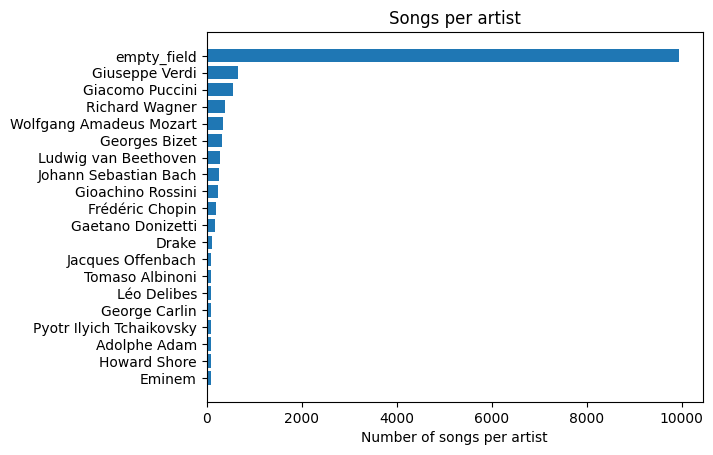

In [206]:
plt.barh(artists.index, artists)
plt.xlabel("Number of songs per artist")
plt.title("Songs per artist")
plt.show()

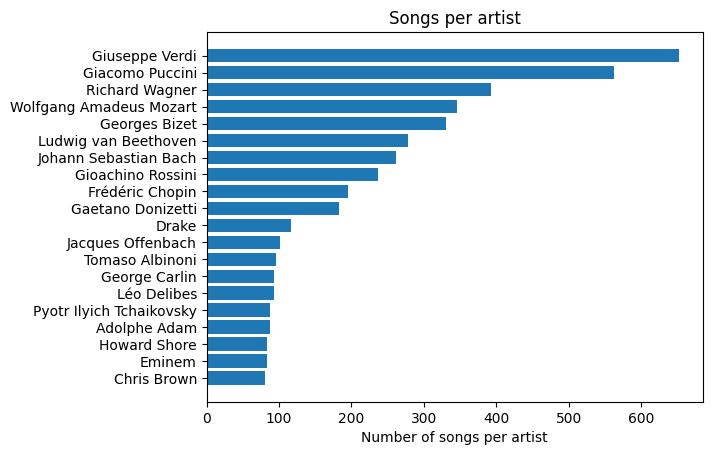

In [207]:
df_new = df_new.drop(df_new[df_new["artist_name"] == "empty_field"].index)
artists = df_new["artist_name"].value_counts()[:20].sort_values(ascending = True)
plt.barh(artists.index, artists)
plt.xlabel("Number of songs per artist")
plt.title("Songs per artist")
plt.show()

In [208]:
df_new= df.copy()
numeric_cols = df_new.select_dtypes(include=[np.number]).columns
categorical_cols = df_new.select_dtypes(include=['object']).columns

#### Statistics of training dataset

In [209]:
df_new['tempo'] = df_new['tempo'].fillna(0)
df_new['duration_ms'] = df_new['duration_ms'].fillna(0)

In [210]:
# Get basic information about the data
print(df_new.info())
# Display the first few rows
print(df_new.head())
# Get summary statistics - to gain insights
print(df_new.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       50000 non-null  int64  
 1   artist_name       50000 non-null  object 
 2   track_name        50000 non-null  object 
 3   track_id          50000 non-null  object 
 4   popularity        50000 non-null  int64  
 5   acousticness      50000 non-null  float64
 6   danceability      50000 non-null  float64
 7   duration_ms       50000 non-null  float64
 8   energy            50000 non-null  float64
 9   instrumentalness  50000 non-null  float64
 10  key               50000 non-null  object 
 11  liveness          50000 non-null  float64
 12  loudness          50000 non-null  float64
 13  mode              50000 non-null  object 
 14  speechiness       50000 non-null  float64
 15  tempo             50000 non-null  float64
 16  time_signature    50000 non-null  float6

#### No. of Categorical and Numerical Columns

In [211]:
numerical_cols = df_new.select_dtypes(include=['number']).columns
print(numerical_cols)

categorical_cols = df_new.select_dtypes(include=['object', 'category']).columns
print(categorical_cols)


Index(['instance_id', 'popularity', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')
Index(['artist_name', 'track_name', 'track_id', 'key', 'mode', 'genre'], dtype='object')


#### Gaining Insights and Visualizations

In [212]:
from sklearn.preprocessing import  LabelEncoder
label_encoder = LabelEncoder()
df_new['genre_encoded'] = label_encoder.fit_transform(df_new['genre'])

In [213]:
numeric_data = df_new.select_dtypes(include=['number'])
correlation_matrix = numeric_data.corr()  # pearson correlation

print(correlation_matrix)

                  instance_id  popularity  acousticness  danceability  \
instance_id          1.000000    0.005256     -0.001173     -0.003870   
popularity           0.005256    1.000000     -0.580503      0.473593   
acousticness        -0.001173   -0.580503      1.000000     -0.469053   
danceability        -0.003870    0.473593     -0.469053      1.000000   
duration_ms         -0.000822   -0.066448      0.049743     -0.139272   
energy              -0.004607    0.359804     -0.683391      0.410504   
instrumentalness    -0.003165   -0.232497      0.300051     -0.341960   
liveness            -0.004662   -0.305581      0.169976     -0.023363   
loudness            -0.005386    0.532263     -0.699495      0.521791   
speechiness         -0.003773   -0.253954      0.188816      0.149198   
tempo               -0.008124    0.104710     -0.139452      0.038204   
time_signature       0.005346    0.209214     -0.224306      0.190031   
valence             -0.002802    0.238476     -0.37

In [214]:
correlation_with_target = correlation_matrix['genre_encoded'].sort_values(ascending=False)
print(correlation_with_target)


genre_encoded       1.000000
popularity          0.213044
danceability        0.173669
loudness            0.060370
time_signature      0.042610
instance_id         0.001134
tempo              -0.007734
acousticness       -0.014477
valence            -0.036059
duration_ms        -0.039788
instrumentalness   -0.099735
energy             -0.103319
speechiness        -0.104756
liveness           -0.141646
Name: genre_encoded, dtype: float64


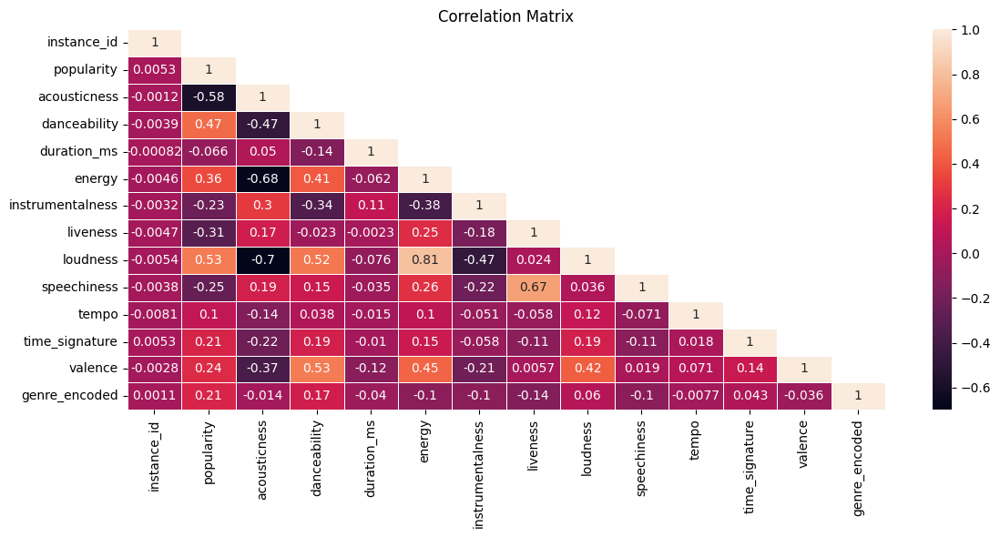

In [215]:
numeric_df = df_new.select_dtypes(include=[np.number])

plt.figure(figsize=(12, 6))
corr_matrix = numeric_df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)
sns.heatmap(corr_matrix, mask=mask,annot=True, linewidths=.7)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

df_new = df_new.drop('genre_encoded', axis=1)

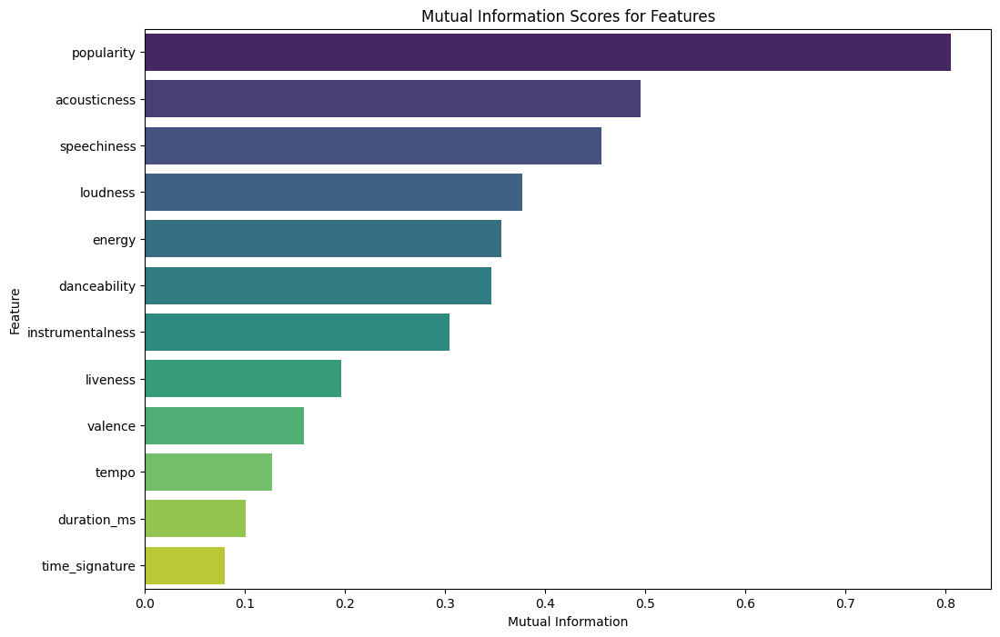

In [216]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import category_encoders as ce 

label_encoder = LabelEncoder()
df_new['genre'] = label_encoder.fit_transform(df_new['genre'])


X = df_new.drop(['genre','artist_name', 'track_name', 'track_id', 'key', 'mode', 'instance_id'], axis=1)
y = df_new['genre'] 

mi_scores = mutual_info_classif(X, y, discrete_features='auto', random_state=0)

mi_scores_df = pd.DataFrame({'Feature': X.columns, 'Mutual Information': mi_scores})
mi_scores_df = mi_scores_df.sort_values(by='Mutual Information', ascending=False)

# Step 8: Visualize the Mutual Information Scores
plt.figure(figsize=(12, 8))
sns.barplot(x='Mutual Information', y='Feature', data=mi_scores_df, palette='viridis')
plt.title('Mutual Information Scores for Features')
plt.show()


17
17
17
17
17
17
17
17
17
17
17
17
17
17


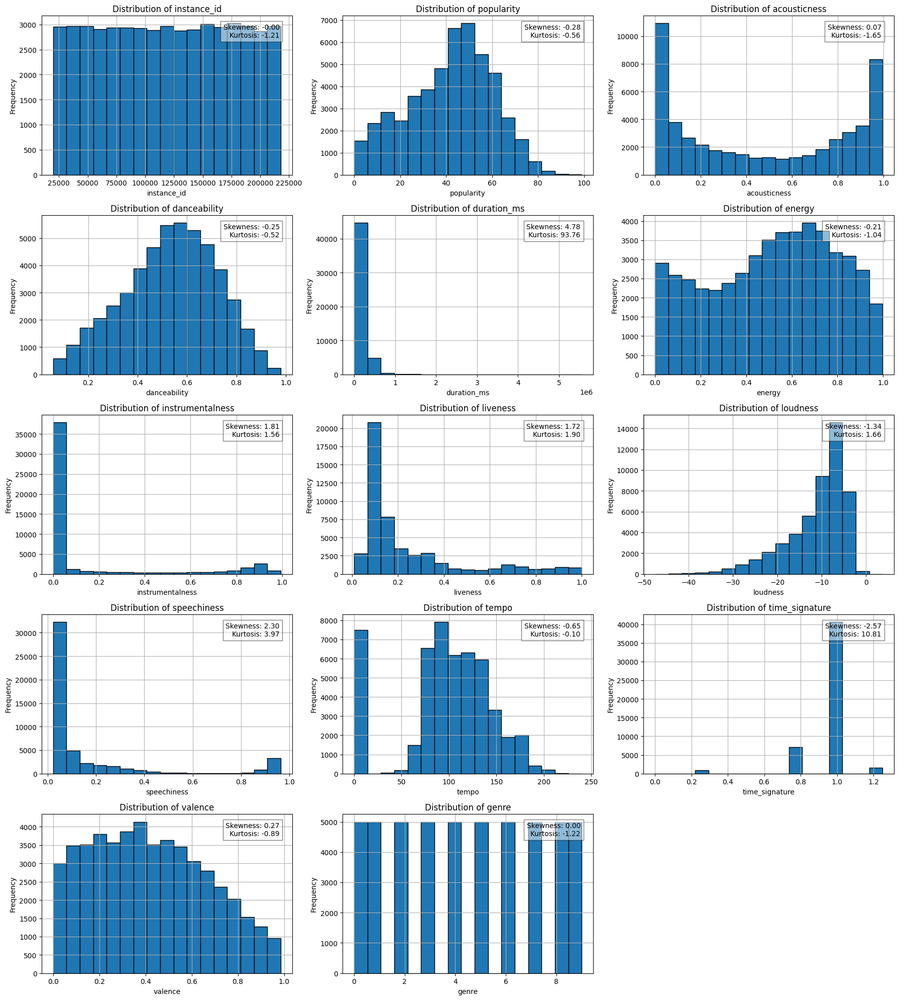

In [217]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

numerical_cols = df_new.select_dtypes(include=['number']).columns

def plot_distribution(ax, feature):
    n_bins = int(np.ceil(np.log2(len(df_new[feature])) + 1))
    print(n_bins)
    df_new[feature].hist(ax=ax, bins=n_bins, edgecolor='k')
    ax.set_title(f'Distribution of {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')
    
    skewness = stats.skew(df_new[feature].dropna())
    kurtosis = stats.kurtosis(df_new[feature].dropna())

    ax.text(0.95, 0.95, f'Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}', 
            transform=ax.transAxes, verticalalignment='top', horizontalalignment='right', 
            bbox=dict(facecolor='white', alpha=0.5))
    
num_features = len(numerical_cols)
n_rows = (num_features + 2) // 3 

fig, axes = plt.subplots(n_rows, 3, figsize=(18, 4 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(numerical_cols):
    plot_distribution(axes[i], feature)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [191]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='box-cox', standardize=False)

# Shift the features in training data if necessary
df_new['liveness_shifted'] = df_new['liveness'] + (1 - df_new['liveness'].min() if df_new['liveness'].min() <= 0 else 0)
df_new['loudness_shifted'] = df_new['loudness'] + (1 - df_new['loudness'].min() if df_new['loudness'].min() <= 0 else 0)
df_new['speechiness_shifted'] = df_new['speechiness'] + (1 - df_new['speechiness'].min() if df_new['speechiness'].min() <= 0 else 0)

# Fit PowerTransformer on training data and apply transformation
df_new['boxcox_liveness'] = pt.fit_transform(df_new[['liveness_shifted']])
df_new['boxcox_loudness'] = pt.fit_transform(df_new[['loudness_shifted']])
df_new['boxcox_speechiness'] = pt.fit_transform(df_new[['speechiness_shifted']])

In [192]:
df_new.drop(columns=['liveness_shifted', 'loudness_shifted', 'speechiness_shifted'], inplace=True)

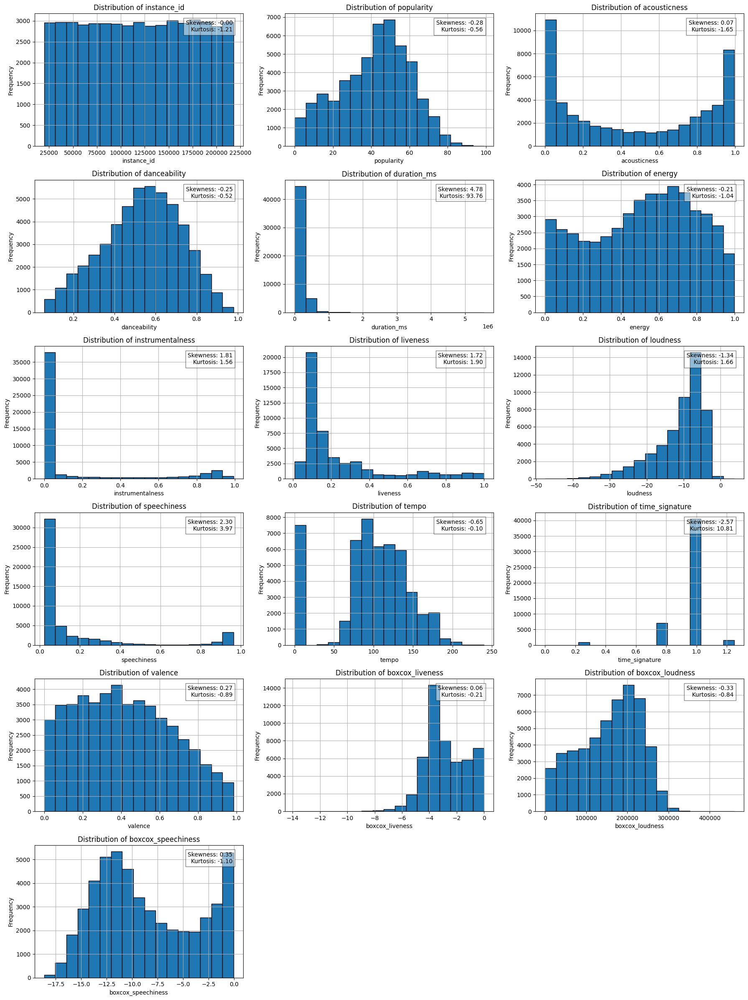

In [194]:
numerical_cols = df_new.select_dtypes(include=['number']).columns

def plot_distribution(ax, feature):
    n_bins = int(np.ceil(np.log2(len(df_new[feature])) + 1))

    df_new[feature].hist(ax=ax, bins=n_bins, edgecolor='k')
    ax.set_title(f'Distribution of {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')
    
    skewness = stats.skew(df_new[feature].dropna())
    kurtosis = stats.kurtosis(df_new[feature].dropna())

    ax.text(0.95, 0.95, f'Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}', 
            transform=ax.transAxes, verticalalignment='top', horizontalalignment='right', 
            bbox=dict(facecolor='white', alpha=0.5))
    
num_features = len(numerical_cols)
n_rows = (num_features + 2) // 3 

fig, axes = plt.subplots(n_rows, 3, figsize=(18, 4 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(numerical_cols):
    plot_distribution(axes[i], feature)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

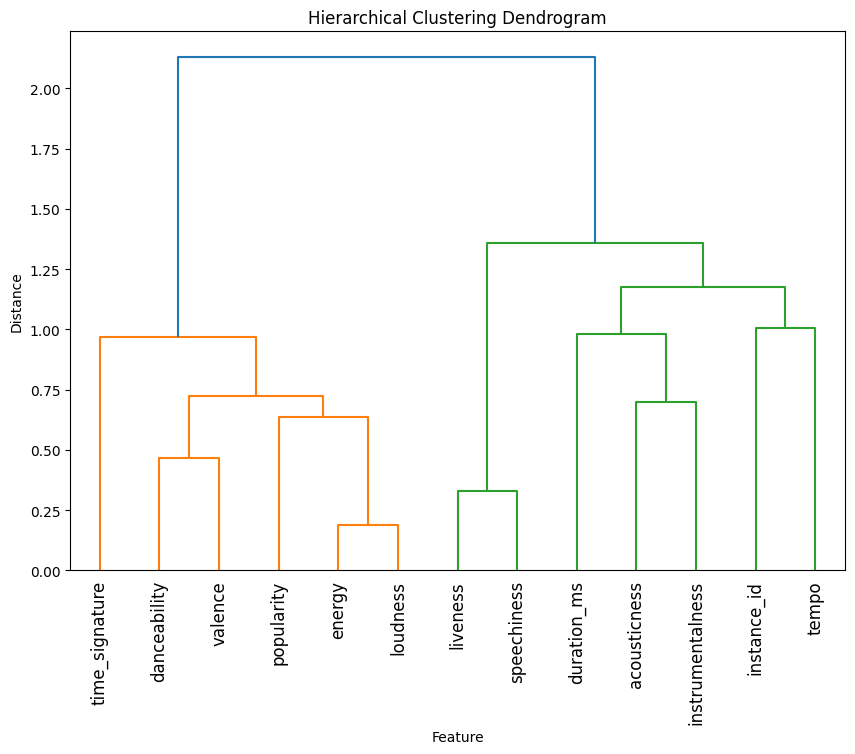

In [185]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

numeric_data = df_new.select_dtypes(include=['number'])
correlation_matrix = numeric_data.corr() 

distance_matrix = 1 - correlation_matrix

condensed_distance_matrix = squareform(distance_matrix)

Z = linkage(condensed_distance_matrix, method='ward')

plt.figure(figsize=(10, 7))
dendrogram(Z, labels=numerical_cols, leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.show()

C:\Users\jhasw\AppData\Local\Temp\ipykernel_16808\1182237221.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3, 4, i + 1)
C:\Users\jhasw\AppData\Local\Temp\ipykernel_16808\1182237221.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3, 4, i + 1)
C:\Users\jhasw\AppData\Local\Temp\ipykernel_16808\1182237221.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3, 4, i + 1)
C:\Users\jhasw\AppData\Local\Temp\ipykernel_16808\1182237221.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; ex

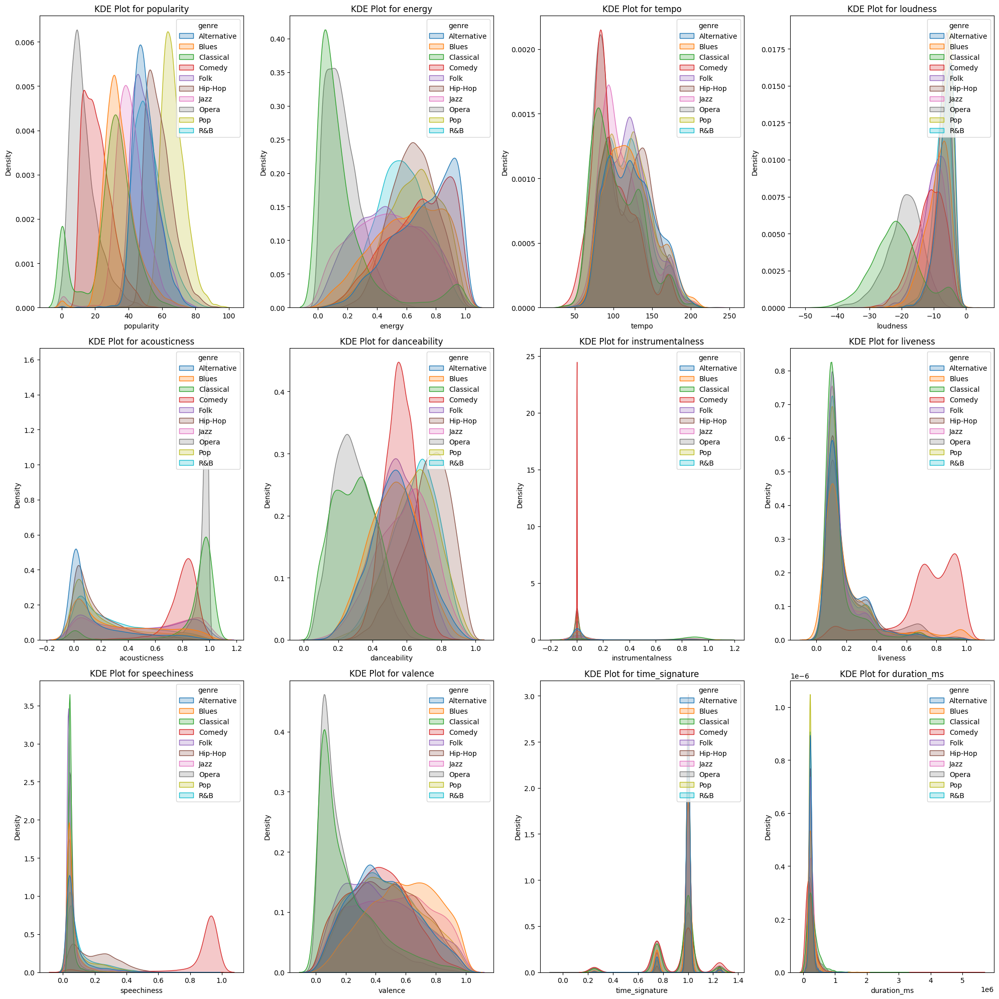

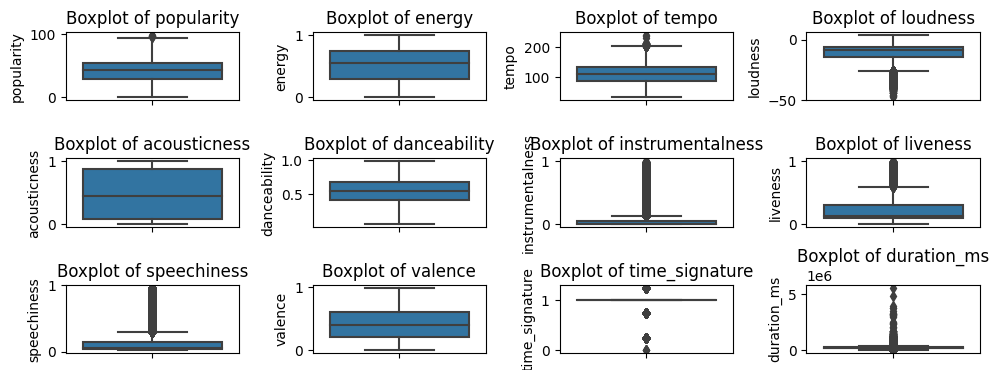

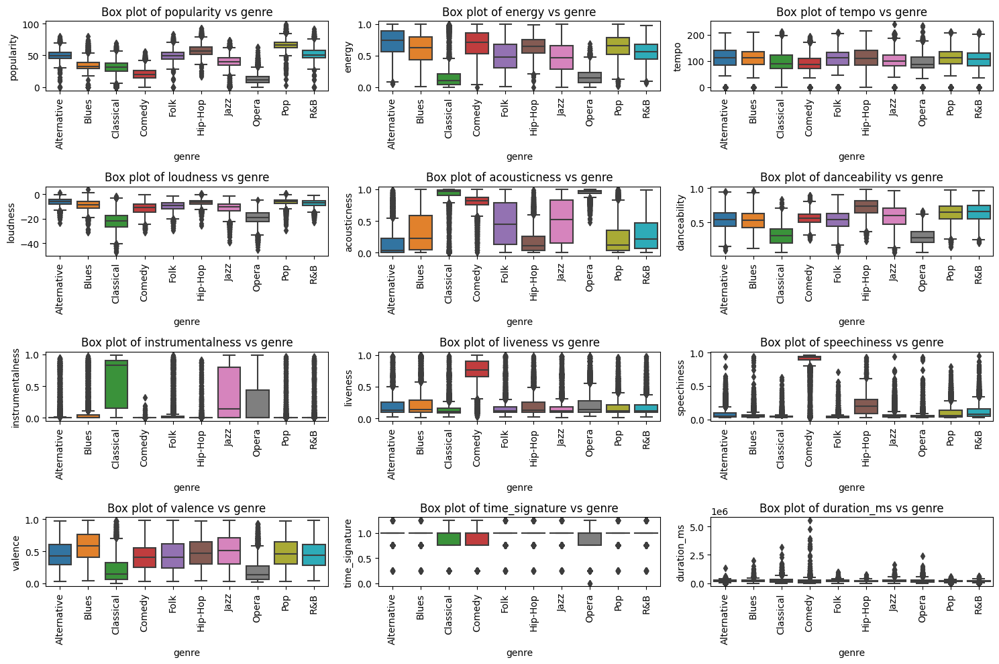

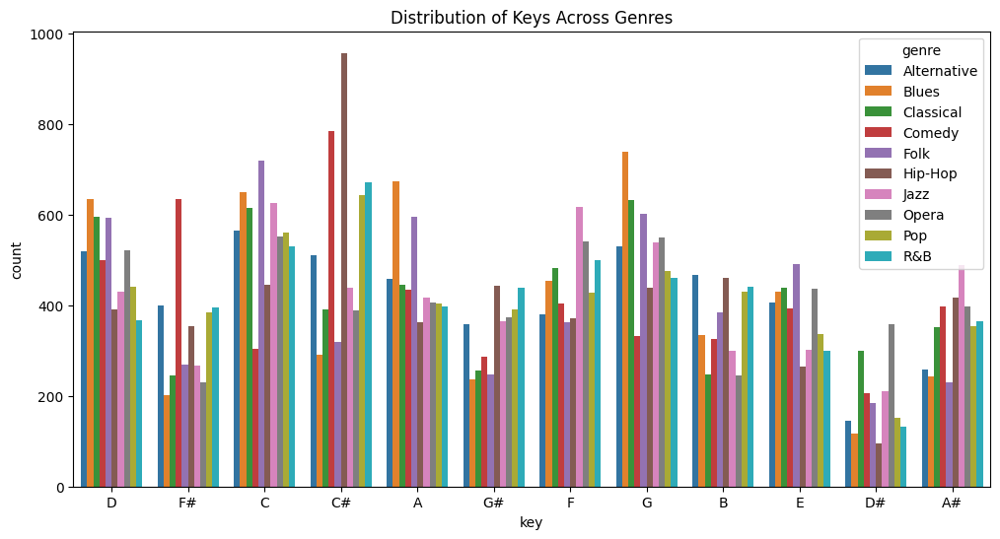

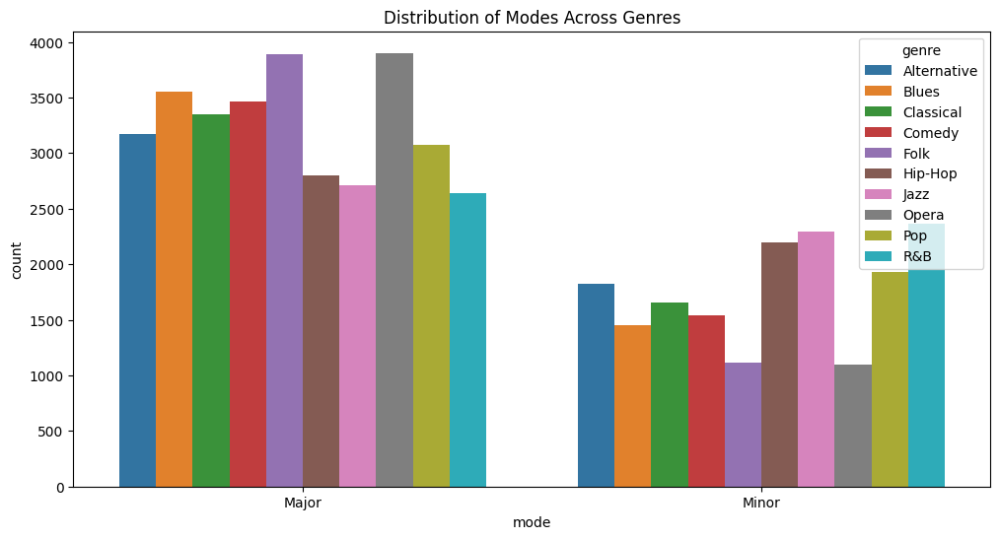

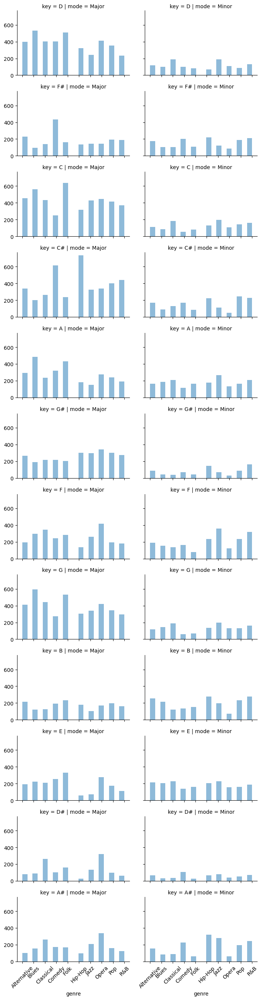

In [188]:
numeric_features = ['popularity', 'energy', 'tempo', 'loudness', 'acousticness', 'danceability', 'instrumentalness','liveness',
            'speechiness','valence', 'time_signature','duration_ms']
num_features = len(numeric_features)


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))
for i, col in enumerate(numeric_features):
    plt.subplot(3, 4, i + 1)
    sns.kdeplot(data=df, x=col, hue='genre', fill=True)
    plt.title(f'KDE Plot for {col}')
    plt.xlabel(col)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()


# Plotting boxplots for all numeric columns
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 5))
axes = axes.flatten()
for i, feature in enumerate(numeric_features):
    sns.boxplot(y=df[feature], ax=axes[i])
    axes[i].set_title(f'Boxplot of {feature}')
for i in range(len(numeric_features), len(axes)):
    fig.delaxes(axes[i])
plt.tight_layout()
plt.show()

# Set up the matplotlib figure
plt.figure(figsize=(15, 10))

# Loop through each numeric feature and create a box plot
for i, feature in enumerate(numeric_features):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(data=df_new, x='genre', y=feature)
    plt.title(f'Box plot of {feature} vs genre')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 6))
sns.countplot(data=df_new, x='key', hue='genre')
plt.title('Distribution of Keys Across Genres')
plt.show()

# Plot the distribution of modes across genres
plt.figure(figsize=(12, 6))
sns.countplot(data=df_new, x='mode', hue='genre')
plt.title('Distribution of Modes Across Genres')
plt.show()

grid = sns.FacetGrid(df_new, col='mode', row='key', height=2.2, aspect=1.6)
grid.map(plt.hist, 'genre', alpha=.5, bins=20)
grid.add_legend()
for ax in grid.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.show()



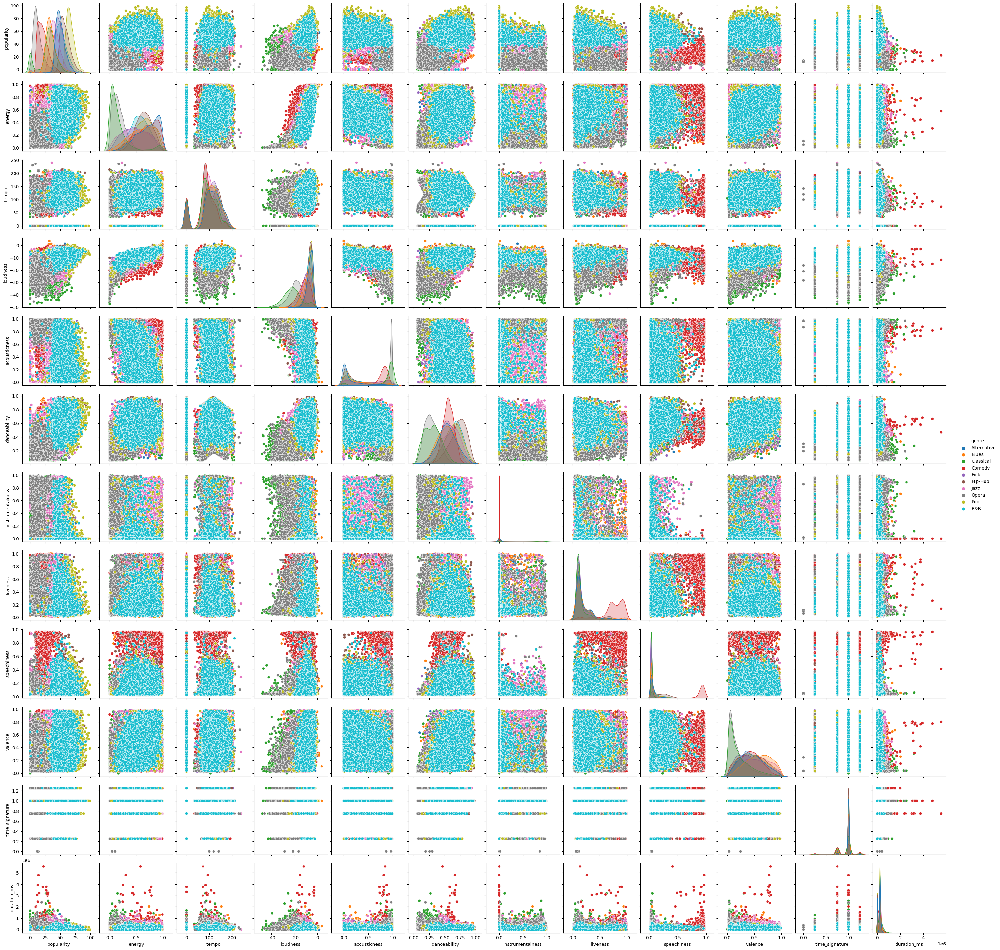

In [186]:
# Pairplot including more features
sns.pairplot(df_new, vars=numeric_features, hue='genre')
plt.show()

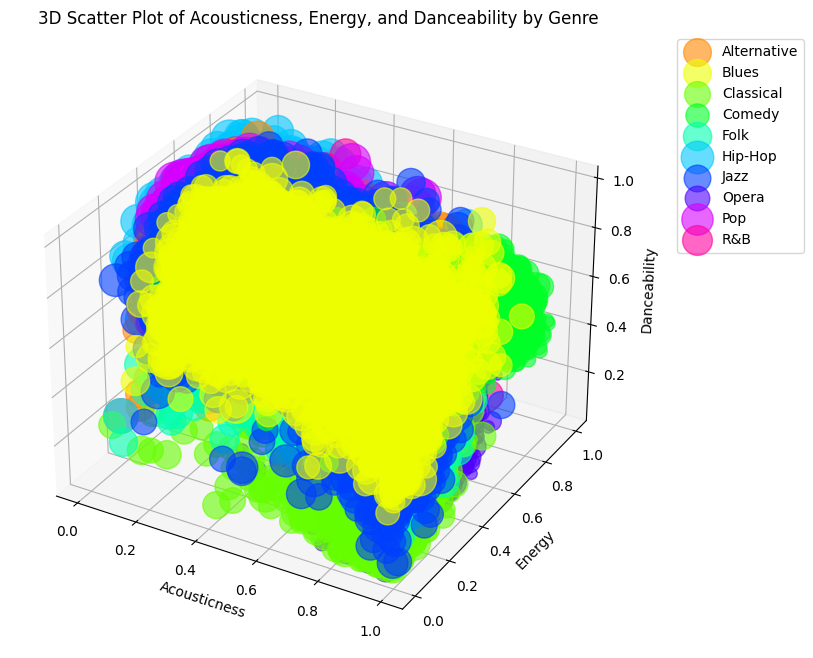

In [189]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Prepare the data
features = ['acousticness', 'energy', 'danceability']
df_filtered = df_new[features + ['genre', 'popularity']]

# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Color map for genres
genre_colors = sns.color_palette("hsv", len(df_filtered['genre'].unique()))
color_mapping = dict(zip(df_filtered['genre'].unique(), genre_colors))

# Plotting each genre
for genre in df_filtered['genre'].unique():
    subset = df_filtered[df_filtered['genre'] == genre]
    ax.scatter(subset['acousticness'], subset['energy'], subset['danceability'],
               s=subset['popularity']*10,  # Scale point size by popularity
               color=color_mapping[genre], label=genre, alpha=0.6)

# Set labels and title
ax.set_xlabel('Acousticness')
ax.set_ylabel('Energy')
ax.set_zlabel('Danceability')
plt.title('3D Scatter Plot of Acousticness, Energy, and Danceability by Genre')

# Show legend
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.show()

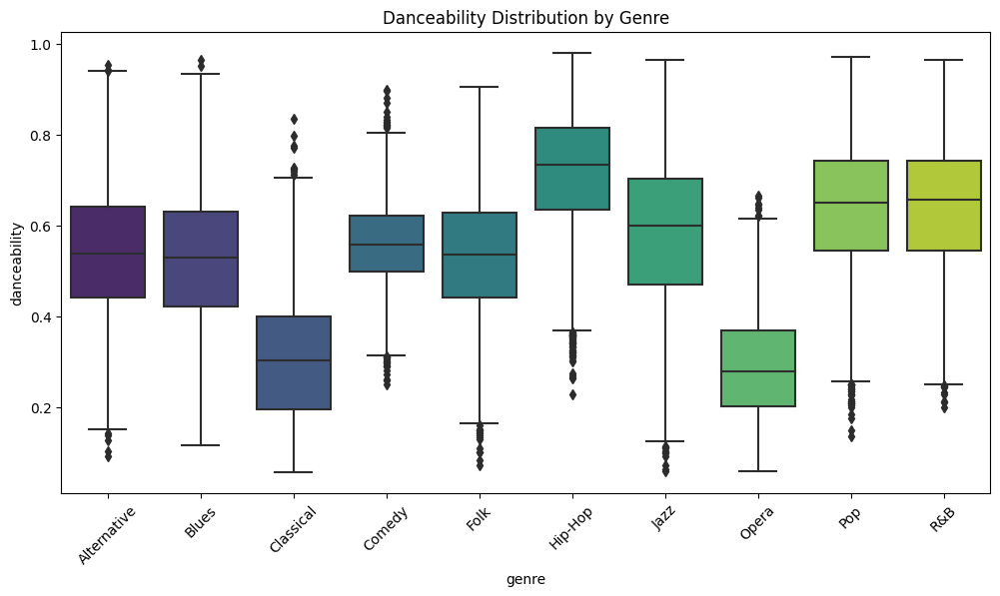

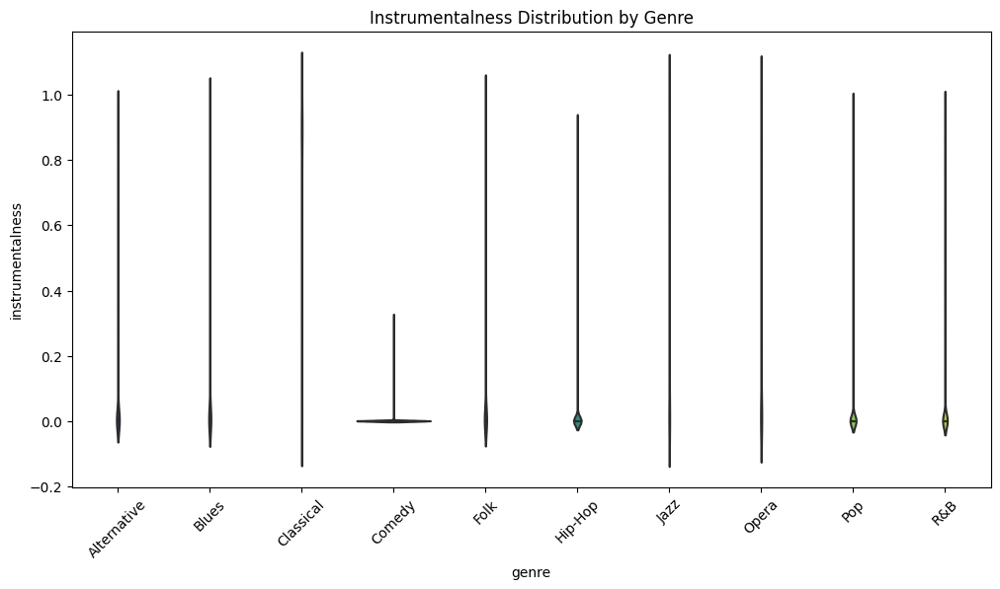

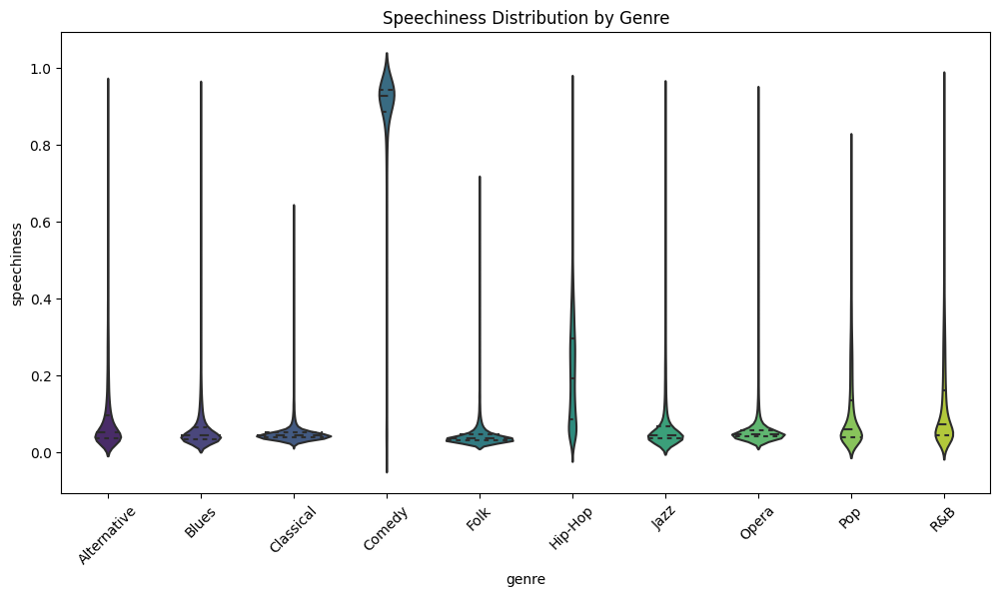

In [190]:
# Boxplot for danceability across genres
plt.figure(figsize=(12, 6))
sns.boxplot(x='genre', y='danceability', data=df_new, palette='viridis')
plt.title('Danceability Distribution by Genre')
plt.xticks(rotation=45)
plt.show()

# Violin plot for instrumentalness and speechiness
plt.figure(figsize=(12, 6))
sns.violinplot(x='genre', y='instrumentalness', data=df_new, palette='viridis', inner='quartile')
plt.title('Instrumentalness Distribution by Genre')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.violinplot(x='genre', y='speechiness', data=df_new, palette='viridis', inner='quartile')
plt.title('Speechiness Distribution by Genre')
plt.xticks(rotation=45)
plt.show()